**<center><font size="7">Flight delays</font></center>**
<center><font size="5">An exploratory data analysis</font></center>

---

> <center><em><span style="color:#A1A0A2"><font size="4">Earlier flights are better because they leave on-time more often!</font></span></em></center>
> <center><span style="color:#A1A0A2">-- Me, all the time, backed by purely annecdotal evidence</span></center>


For years, whenever I have booked a flight to go see my family, attend a conference or workshop, or go on vacation, there has been one travel tip embedded at the center of my planning: *earlier flights are more likely to depart on-time* .

Honestly, though, this is a belief built up by noticing that when I flew earlier in the day things just seemed to go a bit more smoothly. And sometimes I wonder whether it's even remotely correct -- after all, the bad experiences (delayed or cancelled flights) are more memorable than the good, so I'm not sure how far I should really trust my own memory to guide me. Plus, taking earlier flights means waking up earlier in the morning, which is ... not my favorite thing. 

So, finally, I've decided to answer this question once and for all. Are early flights really more reliable? Or have I been subjecting myself to early morning alarm clocks for nothing? 

---
**<center><font size="6">Cleaning & supplementing flights data</font></center>**

For this project, I'll focus on domestic flights in 2018 within the US, using data [scraped](https://nbviewer.jupyter.org/github/atmerritt/delay-expectations/blob/main/flights_scrape.ipynb) from the public [BTS website](https://www.transtats.bts.gov/Tables.asp?DB_ID=120&DB_Name=Airline%20On-Time%20Performance%20Data&DB_Short_Name=On-Time). 

We need to read in the data (we can read in an entire year's worth quickly using `dask.dataframe`), and do a bit of cleaning. For example, we need to fix the time formatting and drop columns we don't need. 

In [1]:
import pandas as pd
import dask.dataframe as dd
import numpy as np
import os

data_folder = '/path/to/data'

ddf = (dd.read_csv(os.path.join(data_folder, '2018_*_ONTIME_REPORTING.csv'))
         .drop(columns=['Unnamed: 26', 'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID', 
                        'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID', 'FLIGHTS'])
      )

def time_format(x):
    # if the flight was cancelled, then the departure time is Null
    if np.isnan(x):
        return None
    
    s = str(int(x)).zfill(4)
    return s[:2]+':'+s[2:]

ddf['CRS_DEP_TIME'] = ddf['CRS_DEP_TIME'].apply(time_format, meta='CRS_DEP_TIME')
ddf['DEP_TIME'] = ddf['DEP_TIME'].apply(time_format, meta='DEP_TIME')
ddf['CRS_ARR_TIME'] = ddf['CRS_ARR_TIME'].apply(time_format, meta='CRS_ARR_TIME')
ddf['ARR_TIME'] = ddf['ARR_TIME'].apply(time_format, meta='ARR_TIME')

We'll also remove US territories and focus on the states for this analysis. To do this, we'll need to convert `ORIGIN_AIRPORT_ID` to a location using a mapping from an airport summary file:

In [2]:
airports = pd.read_csv(os.path.join(data_folder, 'L_AIRPORT_MASTER_CORD.csv'))
airport2state = dict(zip(airports['AIRPORT_ID'], airports['AIRPORT_STATE_NAME']))

ddf['ORIGIN_STATE'] = ddf['ORIGIN_AIRPORT_ID'].map(airport2state)
ddf['DEST_STATE'] = ddf['DEST_AIRPORT_ID'].map(airport2state)

territories = ['U.S. Pacific Trust Territories and Possessions', 
               'Puerto Rico', 'U.S. Virgin Islands']

ddf = ddf[(~ddf['ORIGIN_STATE'].isin(territories)) & (~ddf['DEST_STATE'].isin(territories))]

Assuming we will want to expand our delay analysis beyond scheduled departure times, we'll engineer some new features for each flight to allow us to investigate not only the time, but the day, month, latitude, longitude, and flight distance.

In [3]:
import calendar

def what_day_is_it(x):
    # 0: monday --> 6: sunday
    (yy,mm,dd) = x[0]
    return calendar.weekday(int(yy), int(mm), int(dd))

def is_weekend(x):
    if x >= 5:
        return 1
    return 0

def what_month_is_it(x):
    (yy,mm,dd) = x[0]
    return calendar.month_name[int(mm)]

def what_month_digit(x):
    (yy,mm,dd) = x[0]
    return int(mm)


ddf['CRS_DEP_HOUR'] = ddf['CRS_DEP_TIME'].str.split(':').str[0]
ddf['CRS_DEP_TIMEBIN'] = ddf['CRS_DEP_HOUR'].astype(int).map_partitions(pd.cut, np.linspace(0,24,9))

yymmdd = r'(?P<year>\d{4})-(?P<month>\d{2})-(?P<day>\d{2})'
ddf['DAYOFWEEK'] = (ddf['FL_DATE'].str.findall(yymmdd)
                                  .apply(what_day_is_it, meta='DAYOFWEEK')
                )

ddf['IS_WEEKEND'] = ddf['DAYOFWEEK'].apply(is_weekend, meta='IS_WEEKEND')


ddf['MONTH'] = (ddf['FL_DATE'].str.findall(yymmdd)
                              .apply(what_month_is_it, meta='MONTH')
               )

ddf['MONTHNUM'] = (ddf['FL_DATE'].str.findall(yymmdd)
                                 .apply(what_month_digit, meta='MONTHNUM')
               )

id2lat = dict(zip(airports['AIRPORT_ID'], airports['LATITUDE']))
id2lon = dict(zip(airports['AIRPORT_ID'], airports['LONGITUDE']))

ddf['ORIGIN_LAT'] = ddf['ORIGIN_AIRPORT_ID'].map(id2lat)
ddf['ORIGIN_LON'] = ddf['ORIGIN_AIRPORT_ID'].map(id2lon)
ddf['DEST_LAT'] = ddf['DEST_AIRPORT_ID'].map(id2lat)
ddf['DEST_LON'] = ddf['DEST_AIRPORT_ID'].map(id2lon)

from datashader.utils import lnglat_to_meters
ddf['ORIGIN_X'], ddf['ORIGIN_Y'] = lnglat_to_meters(ddf['ORIGIN_LON'], ddf['ORIGIN_LAT'])
ddf['DEST_X'], ddf['DEST_Y'] = lnglat_to_meters(ddf['DEST_LON'], ddf['DEST_LAT'])

ddf['DISTANCE_BINS'] = ddf['DISTANCE'].map_partitions(pd.cut, np.linspace(0,5000, 51))

Once we're ready, we'll run `compute()` to convert our Dask dataframe to a Pandas dataframe (better for data visualization):

In [4]:
df = ddf.compute()

---
**<center><font size="6">Most flights are on-time</font></center>**

How often are flights delayed? Before digging into the details it helps to get a sense of the "bigger picture". Let's start by simply plotting the distribution of departure delay times during 2018.

In [5]:
import cmocean
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

viz_style = {
    'font.family': 'sans-serif',
    'font.size':11,
    'axes.titlesize':'large',
    'axes.labelsize':'medium',
    'xtick.labelsize':'small',
    'ytick.labelsize':'small',
    'text.color':'#5B5654',
    'axes.labelcolor':'#5B5654',
    'xtick.color':'#5B5654',
    'ytick.color':'#5B5654',
    'axes.edgecolor':'#5B5654',
    'xtick.top':False,
    'ytick.right':False,
    'axes.spines.top':False,
    'axes.spines.right':False,
    'axes.grid':False,
    'boxplot.showfliers':False,
    'boxplot.patchartist':True
}

plt.style.use(viz_style)

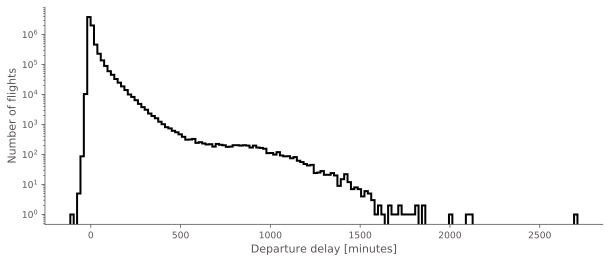

In [6]:
fig = plt.figure(figsize=(10,4))
ax = fig.add_subplot(111)
sns.distplot(df['DEP_DELAY'], bins=150,
             kde=False, hist=True, norm_hist=False, ax=ax, 
             hist_kws={'histtype':'step', 'linewidth':2, 'color':'k', 'alpha':1})

ax.set_yscale('log')
ax.set_ylabel('Number of flights')
ax.set_xlabel('Departure delay [minutes]');

We can immediately notice two things. 

(1) The *majority* of flights departed on-time in 2018 (or even slightly early..! Here's hoping those are only early take-offs and not early gate-closures..). To get more quantitative about it, 75 percent of all flights left at most 7 minutes late, and **90 percent of all flights left at most 37 minutes late.** Not bad..!

(2) This distribution is far from symmetric, and has a heavy tail extending out to longer delay times. In 2018 there were about 7 million domestic flights in the US, and even though most of these departed on time or with small delays, there are still tens or hundreds of thousands that did not. And these of course are the flights we remember and base future travel plans on.

---
**<center><font size="6">When are flights delayed? </font></center>**

The distribution above begs the question(s): *When are flights delayed? What factors contribute to the shape of that tail?*

To help quickly explore the data, we'll set up a wrapper around Pandas' boxplot tool:

In [7]:
def boxplot_wrapper(data, column='DEP_DELAY', groupby='DAYOFWEEK', whis=(10,90),figsize=(6,4)):
    # aesthetics
    boxplotcolors = dict(boxes='#9079A6', whiskers='k', medians='k', caps='k')
    whiskerprops = dict(linestyle='-',linewidth=1.2)
    medianprops = dict(color='k',linewidth=2.0)

    # make figure; create boxplot
    fig, ax = plt.subplots(1,1, figsize=figsize)
    bp = data.boxplot(column=column, by=groupby,  whis=whis, 
                   color=boxplotcolors, whiskerprops=whiskerprops,
                   medianprops=medianprops, grid=False, ax=ax)

    # clean up axis labels
    ax.set_xlabel(' ')
    if column == 'DEP_DELAY':
        ax.set_ylabel('Departure delay [min]')
    else:
        ax.set_ylabel('%s [min]' % column.capitalize().replace('Nas_', 'NAS_').replace('_', ' '))
    fig.suptitle('')
    ax.set_title('')
    
    # fix xticks and labels as needed
    if groupby == 'DAYOFWEEK':
        plt.xticks(range(1,8), ['Mon','Tues','Wed','Thurs','Fri','Sat','Sun'])
    elif groupby == 'IS_WEEKEND':
        plt.xticks(range(1,3), ['Weekday','Weekend'])
    elif groupby == 'CRS_DEP_HOUR':
        ax.set_xlabel('Time of day [hour]')
    elif groupby == 'CRS_DEP_TIMEBIN':
        plt.xticks(range(1,9), ['< 3am', '3-6am', '6-9am', '9am-12pm','12-3pm','3-6pm','6-9pm','>9pm'])
    elif groupby == 'OP_UNIQUE_CARRIER':
        ax.set_xlabel('Airline')
    elif groupby == 'DISTANCE_BINS':
        ax.set_xlabel('Flight distance [miles]')
        plt.xticks(np.arange(1,51)[::5], np.linspace(0,5000, 51).astype(int)[::5])
    elif groupby == 'MONTHNUM':
        plt.xticks(range(1,13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
        
    return fig,ax

---
**<center><font size="6">Are early flights more reliable? </font></center>**

Let's get right to it! We'll make a boxplot to inspect the distribution of delay times within each time period (grouped by hour; i.e. 8am - 9am, 9am - 10am, etc)

---
*How to read this boxplot*:  
The median value in each bin is indicated with a **black horizontal bar**. The <span style="color:#9079A6"><font size="3">**purple shaded boxes**</font></span> bound the interquartile ($25^{\rm th}-75^{\rm th}$) percentile range, and the **black whiskers** bound the $10^{\rm th}-90^{\rm th}$ percentile range.

---

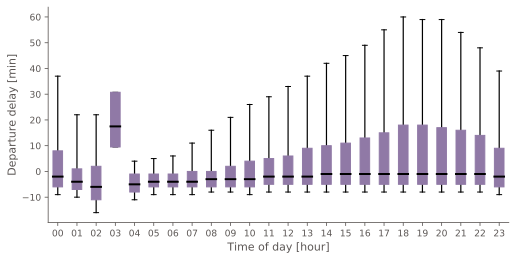

In [8]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='CRS_DEP_HOUR', figsize=(8,4));

Once again, a couple things jump out:

(1) The **median delays** each hour are roughly constant, and very close to zero (i.e., no delay). This is consistent with what we learned from the overall distribution in the previous plot, specifically that the majority of flights leave on-time. 

(2) The **distribution** of delays within each hour are *not* constant. They are asymmetric, with tails extending towards longer delays. What we can see here is that, as we move from the early morning through the afternoon and into the evening, the tails increase to include longer and longer delays!  At 6am 90 percent of flights depart at most ~5 minutes late, at 11am 90 percent of flights leave up to 30 minutes late, and by 6pm 90 percent of flights leave up to an hour late!

At face value, this means I can declare victory and stop worrying that I'm losing sleep for no reason: the data show that even though a "typical" flight will leave on-time throughout the entire day, *the probability that my flight is delayed increases throughout the day.*

---

However, it's more fun to keep digging and understand what causes this trend! And besides, there might be additional factors at play that influence the overall likelihood that I'll be stuck at the airport or miss a connection or etc.

---

At first glance the 3am bin seems bizarre, but it turns out there were only 4 flights that were scheduled during this time period, so we shouldn't be surprised by its outlier behavior:

In [9]:
df.loc[df['CRS_DEP_HOUR']=='03', ['FL_DATE', 'DEP_DELAY']]

,FL_DATE,DEP_DELAY
80267,2018-04-27,15.0
147705,2018-04-30,20.0
84239,2018-02-05,63.0
49124,2018-11-26,-7.0


We can smooth it out by looking at the departure delays in larger bins of time:

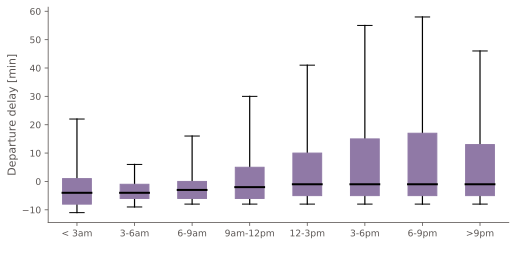

In [10]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='CRS_DEP_TIMEBIN', figsize=(8,4));

---

In addition to the total delay time, our dataset also contains information about the delay times due to specific scenarios. 

For example, we can look at the boxplot for `CARRIER_DELAY`, which describes delays due to the carrier (airline), e.g. airplane cleaning, fueling, baggage/cargo loading, catering, waiting on passengers and/or crew from an incoming flight, weight or balance issues, equipment issues, etc. (Check out [the FAA's help page](https://aspmhelp.faa.gov/index/Types_of_Delay.html) for more details.)

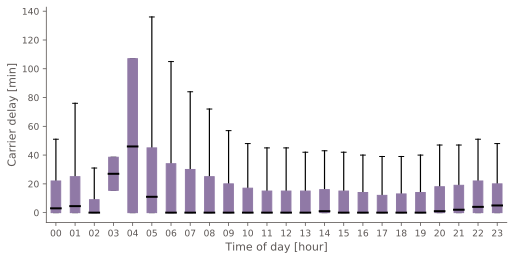

In [11]:
boxplot_wrapper(df, column='CARRIER_DELAY', groupby='CRS_DEP_HOUR', figsize=(8,4));

As we can see, when carrier delays occur, they (are more likely to) happen in the morning, so this does not explain why later flights are delayed more often.

Next up: `NAS_DELAY`, which includes delays imposed by the National Airspace System (NAS) such as heavy traffic volume.

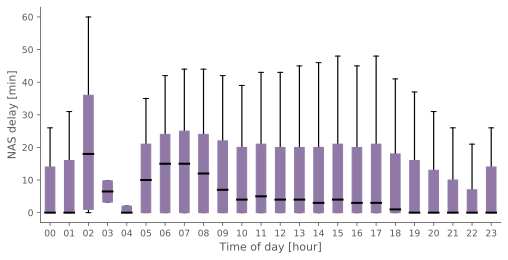

In [12]:
boxplot_wrapper(df, column='NAS_DELAY', groupby='CRS_DEP_HOUR', figsize=(8,4));

Again, NAS delays cannot account for the trend we saw in overall delays. The tails of these distributions do not show any strong trends, and the median values indicate that, similar to the carrier delays, NAS delays primarily affect earlier flights.

We'll do the same thing with `LATE_AIRCRAFT_DELAY`, which, as the name suggests, describes delays due to a late arrival of the aircraft needed for the flight.

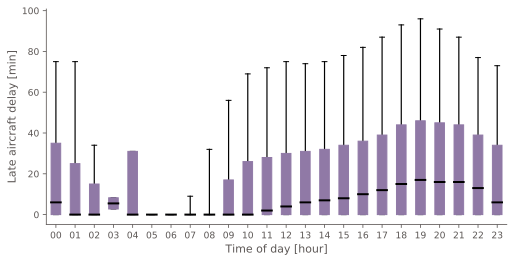

In [13]:
boxplot_wrapper(df, column='LATE_AIRCRAFT_DELAY', groupby='CRS_DEP_HOUR', figsize=(8,4));

Aaand this is starting to make a lot more sense. 

In the early morning (before 9am or so), late aircraft delays are essentially non-existent -- in other words, these tend to be the first flights the planes will make on a given day.

However, over the course of the day, delays start happening for one reason or another. Often time lost to delays can be "made up in the air" if conditions are favorable and the delay wasn't too long, but when this is not the case, a late plane starts a domino effect of sorts that continues throughout the day. We can see the steady increase in the median delay times due to late aircraft increasing from 0 min at 9am to 20 min by 7pm (and the $90^{\rm th}$ percentile includes flights up to 100 minutes late for this bin). 

---
**<center><font size="6">Day of the week</font></center>**

So far, we've learned that flights scheduled earlier in the day are more likely to depart on-time, *mostly* due to the buildup of small delays over the course of the day that push later flights towards longer delay times. But the distribution of delay times in each hourly bin is still wide, which hints that there is more going on. 

So, let's check out delays by day of the week:

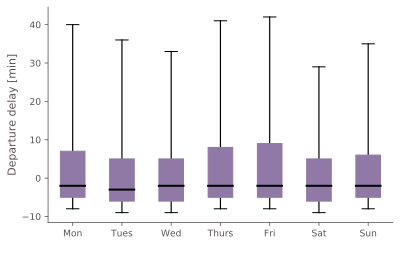

In [14]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='DAYOFWEEK');

This is, to me, somewhat surprising. I would have naïvely assumed that flying on the weekends is worse than during the week, but there doesn't seem to be a significant difference -- and if anything, the opposite is true. For instance, on Saturdays, 90 percent of flights left less than 30 minutes late, but on several days during the week 90 percent of flights left less than 40 minutes late. 

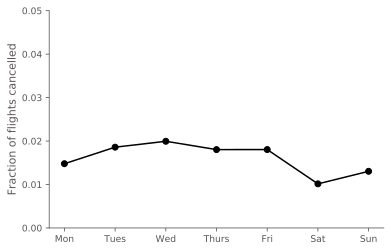

In [15]:
fig, ax = plt.subplots(1,1, figsize=(6,4))
ax.plot(df.groupby('DAYOFWEEK')['CANCELLED'].mean(), '-o', color='k')
plt.xticks(range(7), ['Mon','Tues','Wed','Thurs','Fri','Sat','Sun'])
ax.set_ylabel('Fraction of flights cancelled')
ax.set_ylim(0,0.05);

---
**<center><font size="6">Seasonal/monthly trends</font></center>**

So far we've been looking at time bins that can be averaged across the whole year (i.e., a years' worth of Mondays or etc). But there are certain times of year that we might expect flights to be more delayed, so let's check that out too:

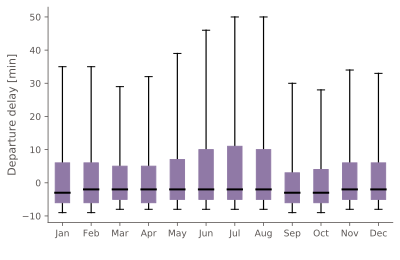

In [16]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='MONTHNUM');

We can see from this that the summer months -- June, July, and August -- have distributions that feature longer delays more heavily. This likely corresponds to vacation travel in the US (notice the steep drop-off in the 90th percentile ticks between August and September, signaling the start of school). 

Longer delays are also more likely in the winter months (November through February) than in the spring and early fall. To gain a little more insight as to why this might be, we can break things down by delay type again:

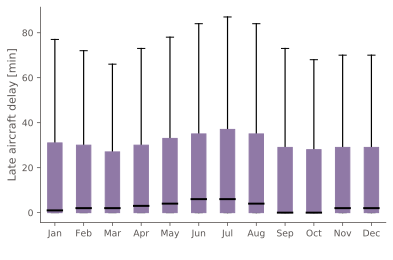

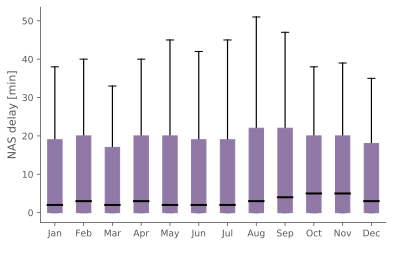

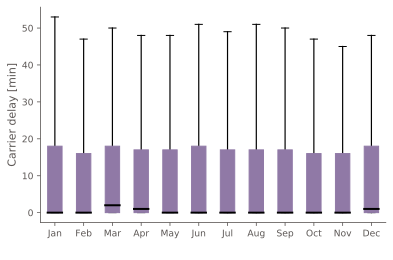

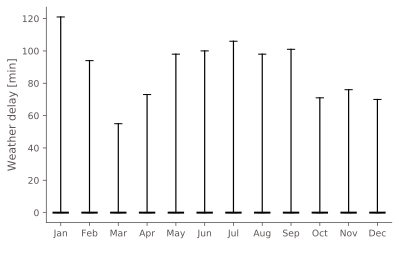

In [17]:
boxplot_wrapper(df, column='LATE_AIRCRAFT_DELAY', groupby='MONTHNUM');
boxplot_wrapper(df, column='NAS_DELAY', groupby='MONTHNUM');
boxplot_wrapper(df, column='CARRIER_DELAY', groupby='MONTHNUM');
boxplot_wrapper(df, column='WEATHER_DELAY', groupby='MONTHNUM',whis=(1,99));

Note that the weather delay plot is slightly different - the **whiskers** bound the $1^{\rm st} - 99^{\rm th}$ percentiles instead of the $10^{\rm th} - 90^{\rm th}$. This is because (as you can see from the plot) non-zero weather delays are actually pretty rare. 

---

NAS delays and late aircraft delays both roughly follow the same monthly trends as the total departure delays, so they are likely the reason why summer flights are delayed more often. Additionally, despite not being a common occurance, weather-related delays have a broad peak in summer as well as a spike in January (also identifiable in the total departure delays plot). 

---
**<center><font size="6">Flight length</font></center>**

Another possibility is that the flight itself impacts its chances of being delayed. Are longer flights delayed less often than shorter flights? 

We can take a look:

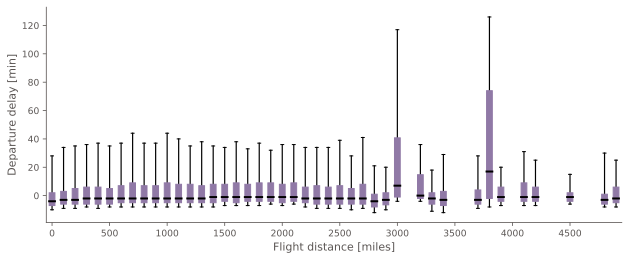

In [18]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='DISTANCE_BINS', figsize=(10,4));

Contrary to what I expected, there's not much information here; the probability that a flight is delayed does not seem to depend on how long it will be in the air.

On the other hand, the flight length *does* seem to impact whether or not the plane ever takes off -- while cancellation rates are low overall, there is a clear trend towards fewer cancellations for longer flights:

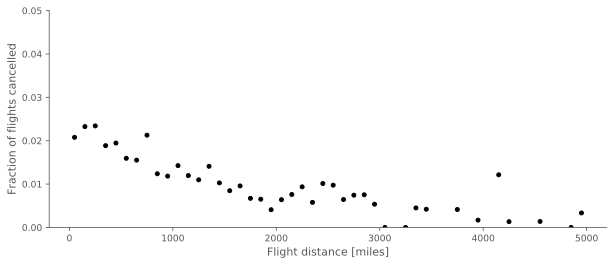

In [19]:
fig, ax = plt.subplots(1,1, figsize=(10,4))
cancel_fracs = df.groupby('DISTANCE_BINS')['CANCELLED'].mean()
ax.plot([interval.mid for interval in cancel_fracs.index], cancel_fracs, 'o', color='k', ms=4)
ax.set_xlabel('Flight distance [miles]')
ax.set_ylabel('Fraction of flights cancelled')
ax.set_ylim(0,0.05);

---
**<center><font size="6">Airlines </font></center>**

Are some airlines more reliable than others? 

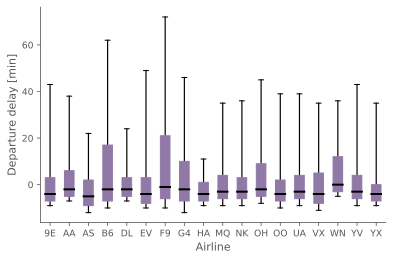

In [20]:
boxplot_wrapper(df, column='DEP_DELAY', groupby='OP_UNIQUE_CARRIER');

Short answer - yes, some airlines *are* more reliable than others. Eyeballing the airlines that are most likely to have longer delay times, we can see what those codes translate to:

In [21]:
airlines = pd.read_csv(os.path.join(data_folder, 'L_UNIQUE_CARRIERS.csv_'))
code2name = dict(zip(airlines['Code'], airlines['Description']))
for code in ['F9', 'B6', 'EV', 'G4','OH']:
    print(code2name[code])

Frontier Airlines Inc.
JetBlue Airways
ExpressJet Airlines LLC
Allegiant Air
PSA Airlines Inc.


So, at least in 2018, flying on any of the above increases your chances of having your flight delayed.

--- 

A related question we can ask is: does the size of the airline matter? That is, do airlines with more flights also have longer delay times? (Considering the impact of late-arriving aircraft on overall delay times, this seems like a reasonably likely scenario..)

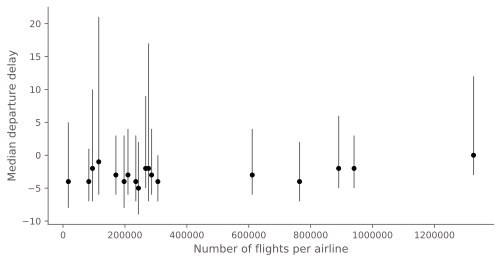

In [22]:
fig, ax = plt.subplots(1,1, figsize=(8, 4))
agroup_delays = df.groupby('OP_UNIQUE_CARRIER')['DEP_DELAY']

ax.errorbar(agroup_delays.count(), agroup_delays.quantile(0.50),
            yerr=[agroup_delays.quantile(0.50)-agroup_delays.quantile(0.25),
                  agroup_delays.quantile(0.75)-agroup_delays.quantile(0.50)],
            fmt='o', color='k', ecolor='dimgrey', ms=4, elinewidth=1)
ax.set_xlabel('Number of flights per airline')
ax.set_ylabel('Median departure delay');

In the plot above, the error bars show the interquartile range. 

There is no clear trend between airline size and median delay time -- however, we can see that *some* of the smaller airlines tend to be less consistent than the midsize airlines (the largest airline, *Southwest Airlines*, is also less consistent with its departures).

---
**<center><font size="6">Airports</font></center>**

What about airports? Is the size of an airport (approximated here by the number of departing flights per month) related to typical delay times? 

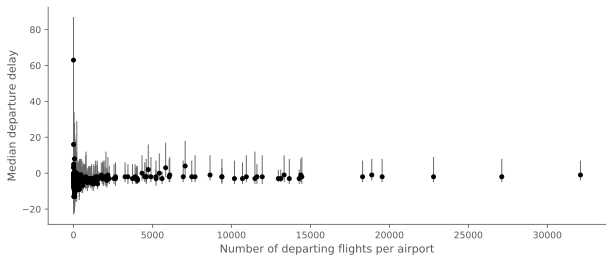

In [23]:
fig, ax = plt.subplots(1,1, figsize=(10, 4))
agroup_delays = df.groupby('ORIGIN_AIRPORT_ID')['DEP_DELAY']

ax.errorbar(agroup_delays.count()/12, agroup_delays.quantile(0.50),
            yerr=[agroup_delays.quantile(0.50)-agroup_delays.quantile(0.25),
                  agroup_delays.quantile(0.75)-agroup_delays.quantile(0.50)],
            fmt='o', color='k', ecolor='dimgrey', ms=4, elinewidth=1)
ax.set_xlabel('Number of departing flights per airport')
ax.set_ylabel('Median departure delay');

Again, the error bars show the interquartile range. 

Mid- to large-sized airports appear to be fairly consistent; however, smaller airports exhibit a large range in delay times.

Let's look at this another way -- geographically! Each airport has latitude and longitude coordinates, and earlier we projected these onto a 2D grid for a less distorted view. 

To help guide the eye, we'll also overlay US state boundaries, which are available [on data.gov](https://catalog.data.gov/dataset/tiger-line-shapefile-2017-nation-u-s-current-state-and-equivalent-national).

In [24]:
import geopandas as gpd
states = gpd.read_file(os.path.join(data_folder, 'tl_2017_us_state','tl_2017_us_state.shp'))
states = states.to_crs("EPSG:3857")

We'll also define a range of latitude and longitude values to plot (eyeballed from Google maps), and convert these into projected (x,y) coordinates: 

In [25]:
# US coord limits, approximately - lng(east/west) and lat(north/south)
US = ((-125, -65), (24, 50)) 
x_range, y_range = [list(r) for r in lnglat_to_meters(US[0], US[1])]

The cell below defines a function to plot the locations of each airport overlaid on a map of the US. 

In [26]:
import matplotlib.patches as patches

def get_scaled_colors(x, scaleby=1.0):
    if (scaleby > 1.0) & (type(x) is not int):
        x[x < 0] = 0
    xs = x**scaleby
    return xs

def map_delays(data, endpoint='ORIGIN'):
    delay_types = ['DEP_DELAY', 'WEATHER_DELAY', 'CARRIER_DELAY', 
                   'LATE_AIRCRAFT_DELAY', 'NAS_DELAY', 'SECURITY_DELAY']
    
    delay_cmap = cmocean.cm.matter
    delay_thresh = 30 #min
    scale_sizes = 0.5
    scale_colors = 1.1 #1.3

    g = df.groupby('%s_AIRPORT_ID' % endpoint)
    g_ak = df[df['%s_STATE' % endpoint]=='Alaska'].groupby('%s_AIRPORT_ID' % endpoint)
    g_hi = df[df['%s_STATE' % endpoint]=='Hawaii'].groupby('%s_AIRPORT_ID' % endpoint)   
    
    fig,axes = plt.subplots(2,3, figsize=(12,6))
    
    # note: the /12's are so that the sizes represent the average number of flights _per month_ for each airport
    for ind, ax, delay in zip(range(len(delay_types)), axes.ravel(), delay_types):
        if 'NAS' in delay:
            ax.set_title(delay.lower().replace('nas_','NAS '), fontsize='medium')
        elif 'DEP_' in delay:
            ax.set_title(delay.lower().replace('dep_','Departure '), fontsize='medium')
        else:
            ax.set_title(delay.lower().replace('_',' ').capitalize(), fontsize='medium')

        states.boundary.plot(linewidth=0.4, edgecolor='grey', facecolor='none', alpha=0.4, ax=ax)


        sc = ax.scatter(g['%s_X' % endpoint].mean(), g['%s_Y' % endpoint].mean(), 
                        c=get_scaled_colors(g[delay].mean(), scaleby=scale_colors), 
                        s=(g['%s_LON' % endpoint].count()/12)**scale_sizes, cmap=delay_cmap, 
                        vmin=0, vmax=get_scaled_colors(delay_thresh, scaleby=scale_colors), alpha=0.75)
        ax.set_xlim(x_range)
        ax.set_ylim(y_range)
        ax.set_axis_off()

        x0, y0, xw, yw = ax.get_position().bounds
        if ind >=3:
            y0 += 0.05

        ax2 = fig.add_axes([x0-0.07,y0,xw*0.5,yw*0.5])
        states[states['NAME']=='Alaska'].boundary.plot(linewidth=0.4, edgecolor='grey', facecolor='none', 
                                                       alpha=0.4, ax=ax2)
        ax2.scatter(g_ak['%s_X' % endpoint].mean(), g_ak['%s_Y' % endpoint].mean(), 
                    c=get_scaled_colors(g_ak[delay].mean(), scaleby=scale_colors), 
                    s=(g_ak['%s_LON' % endpoint].count()/12)**scale_sizes, cmap=delay_cmap, 
                    vmin=0, vmax=get_scaled_colors(delay_thresh, scaleby=scale_colors), alpha=0.75)
        ax2.set_xlim(-2.1e7,-1.4e7)
        ax2.set_axis_off() 

        ax3 = fig.add_axes([x0-0.02,y0,xw*0.5,yw*0.5])
        states[states['NAME']=='Hawaii'].boundary.plot(linewidth=0.4, edgecolor='grey', facecolor='none', 
                                                       alpha=0.4, ax=ax3)
        ax3.scatter(g_hi['%s_X' % endpoint].mean(), g_hi['%s_Y' % endpoint].mean(), 
                    c=get_scaled_colors(g_hi[delay].mean(), scaleby=scale_colors), 
                    s=(g_hi['%s_LON' % endpoint].count()/12)**scale_sizes, cmap=delay_cmap, 
                    vmin=0, vmax=get_scaled_colors(delay_thresh, scaleby=scale_colors), alpha=0.75)
        ax3.set_xlim(-1.85e7,-1.7e7)
        ax3.set_axis_off() 


    fig.subplots_adjust(bottom=0.23)
    if endpoint == 'ORIGIN':
        fig.suptitle('Origin Airports', fontsize='large')
    elif endpoint == 'DEST':
        fig.suptitle('Destination Airports', fontsize='large')

    sizeleg = fig.add_axes([0.4,0.1,0.2,0.05])
    sizeleg.text(0.5,0.85,'Flights per month', verticalalignment='center', horizontalalignment='center')
    sizeleg.scatter([0.1,0.3,0.6], [0.5,0.5,0.5], c='grey', s=np.array([1e2, 1e3, 1e4])**scale_sizes, alpha=0.75)
    sizeleg.text(0.13,0.5,'100',verticalalignment='center',horizontalalignment='left', fontsize='small')
    sizeleg.text(0.34,0.5,'1,000',verticalalignment='center',horizontalalignment='left', fontsize='small')
    sizeleg.text(0.65,0.5,'10,000',verticalalignment='center',horizontalalignment='left', fontsize='small')
    sizeleg.set_xlim(0,1)
    sizeleg.set_axis_off()

    colorleg = fig.add_axes([0.35,0.03,0.3,0.03])
    colorleg.set_title('Average departure delay [min]', fontsize='medium')
    for i,avgdel in enumerate(range(0,35,5)):
        scaled_avg = get_scaled_colors(avgdel, scaleby=scale_colors)
        colorleg.add_patch(patches.Rectangle((i*(1/7),0), (1/7), 1, facecolor=sc.to_rgba(scaled_avg)))
        if i <= 3:
            pcolor = 'k'
        else:
            pcolor = 'gainsboro'
        colorleg.text(i*(1/7)+0.075, 0.5, str(int(avgdel)), horizontalalignment='center',verticalalignment='center',
                      fontsize='small', color=pcolor)
    colorleg.set_axis_off()
    
    return fig

We can use this plotting tool to explore the causes of delay across the US for both departing and arriving flights!

---

*How to read these charts:*  
* The <span style="color:black"><font size="3">**size**</span> of the points scales with the size of the airport (once again approximated by the number of departing flights per month).
* The <span style="color:#950F8D"><font size="3">**color**</span> of the points indicates the *average* delay time for this airport (averaged across all of 2018).
    
The top left shows the **total departure delays** and the other panels show specific subsets of delay types.
    
---

Let's take a look at "origin" airports; i.e. the departure airport:

In [27]:
map_delays(df, endpoint='ORIGIN');

Starting with the **top left** panel, we can see that delays across the contiguous 48 states is relatively uniform, with an average delay of around 10 minutes (keep in mind, this average is already heavily affected by the tail of the delay distribution; the median flight leaves 2 minutes *early*). 

Alaska and Hawaii fare slightly better, with average delays of less than a minute, and there are hints of structure throughout the map on larger scales.

To better understand this, we can look at various specific reasons for delay. Late aircraft delays and security delays have the least amount of structure (planes are late everywhere, and security delays are rare everywhere). There is a clustering of longer delays due to weather and carriers around the mid-west region. NAS delays are also (somewhat) elevated in that region, as well as along the coasts. 

So -- it seems that the specific airport you are flying out from *does* impact your chances of having a delayed departure to some degree, although the reasons differ somewhat from region to region. 

And, as we can see below, the picture is essentially unchanged if we focus on the *destination* airports:

In [28]:
map_delays(df, endpoint='DEST');

Interestingly, when viewed from the perspective of destination airports, the NAS delays map appears to show a hint of a correlation between the average delay and airport size (notice: the largest points are also the darkest). Since NAS delays include air traffic, it makes sense that the busier airports are more strongly affected. For example, we can immediately identify some well-known hubs, such as San Francisco (SFO), New York (JFK), Dallas (DFW) and O'Hare (ORD).

---
**<center><font size="6">Takeaways & next steps</font></center>**

At this point, a more detailed / long-winded answer to the question of whether earlier flights are more robust to delays is: 

Although *most* flights depart on-time -- yes, flights scheduled earlier in the day are more likely to depart on-time; this is (mostly) due to an accumulation of delays (especially late arrivals of planes) over the course of the day that push later flights towards longer and longer delays. There is a lot of scatter here, though, which is driven by the time of year (summer is the worst) as well as your choice of airline and where you are flying from/to. 

---

Despite having done this analysis on domestic US flights, I would also be very interested to see how things change for international flights or for domestic flights in other countries (for example Germany, where I've lived for the past 3 years). 

---

Another thing that would be cool -- and what I'm working on now -- is using these data to model the chances of a given flight being delayed based on various information that you would have at the time of booking. We can train our model on the 2018 data and test it on 2019 data (or 2020, although I suspect the trends will be very different this year). 

While this is very much a work in progress, here's a teaser in the form of a quick look at the structure within pairs of features:

In [29]:
import matplotlib.gridspec as gridspec

def feature_grid(data, x=None, y=None, z='DEP_DELAY', quant=None):
    
    if quant is None:
        ser = data.groupby([x, y], dropna=False)[z].mean()
    else:
        ser = data.groupby([x, y], dropna=False)[z].quantile(quant)
    
    sorted_uniq_x = np.sort(data[x].unique())
    sorted_uniq_y = np.sort(data[y].unique())

    grid_cols, grid_rows = np.meshgrid(sorted_uniq_x, sorted_uniq_y)

    im = np.zeros(grid_rows.ravel().shape)

    for (rr, cc) in zip(enumerate(grid_rows.ravel()), enumerate(grid_cols.ravel())):
        ind, row = rr
        _, col = cc
                
        if x == 'CRS_DEP_HOUR':
            col = str(col).zfill(2)
            
        if (col, row) in ser.index:
            val = ser[(col, row)]
        else:
            val = np.nan

        im[ind] = val

    im = im.reshape(grid_rows.shape)
    return im


uniq_carriers = np.sort(df['OP_UNIQUE_CARRIER'].unique())
uniq_airports = np.sort(df['ORIGIN_AIRPORT_ID'].unique())

ticks_dict = {
    'DAYOFWEEK':range(7)[::2],
    'MONTHNUM':range(12)[::3],
    'CRS_DEP_HOUR':range(24)[::3],
    'OP_UNIQUE_CARRIER':range(len(uniq_carriers))[::3],
    'ORIGIN_AIRPORT_ID':uniq_airports[::70],
    'STATE':range(1,51)[::10]
}

labels_dict = {
    'DAYOFWEEK':['Mon','Tues','Wed','Thurs','Fri','Sat','Sun'][::2],
    'MONTHNUM':['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'][::3],
    'CRS_DEP_HOUR':['%sh'%t for t in range(24)][::3],
    'OP_UNIQUE_CARRIER':uniq_carriers[::3],
    'ORIGIN_AIRPORT_ID':uniq_airports[::70],
    'STATE':range(1,51)[::10]
}

rot_dict = {
    'DAYOFWEEK':45,
    'MONTHNUM':45,
    'CRS_DEP_HOUR':45,
    'OP_UNIQUE_CARRIER':45,
    'ORIGIN_AIRPORT_ID':45,
    'STATE':45
}

def feature_grid_triangle(data, features=None, z='DEP_DELAY', quant=None, 
                          cmap=cmocean.cm.deep, vmin=0, vmax=1, figsize=(10,10)):
    
    if features is None:
        features = data.columns

    n_ft = len(features)
    
    f = plt.figure(figsize=figsize)
    spec = gridspec.GridSpec(nrows=n_ft, ncols=n_ft)
    
    for i1, ft_1 in enumerate(features):
        for i2, ft_2 in enumerate(features):
            ax = f.add_subplot(spec[i1, i2])
            
            if ft_1 == ft_2:               
                categories = data[ft_1].value_counts().sort_index()
                if ft_1 == 'ORIGIN_AIRPORT_ID':
                    ax.bar(categories.index,categories.values, color='silver', width=50)
                else:
                    ax.bar(categories.index,categories.values, color='silver')
                ymin,ymax = ax.get_ylim()
                ax.set_ylim(ymin,1.75*ymax)

            else:
                grid = ax.imshow(feature_grid(data, x=ft_2, y=ft_1, z=z, quant=quant), 
                                  aspect='auto', vmin=vmin, vmax=vmax, cmap=cmap)
          
            if i2 == 0:
                ax.set_ylabel(ft_1, fontsize='small')
            if i1 == n_ft-1:
                ax.set_xlabel(ft_2, fontsize='small')
                
            # more formatting
            if i1 != n_ft -1:
                ax.set_xticklabels(['' for l in ax.get_xticklabels()])
                ax.tick_params(axis='x', which='both', length=0)
            if i2 > 0:
                ax.set_yticklabels(['' for l in ax.get_yticklabels()])
                ax.tick_params(axis='y', which='both', length=0)
            if (i2 == 0) & (i1 == 0):
                ax.set_yticklabels(['' for l in ax.get_yticklabels()])
                ax.tick_params(axis='y', which='both', length=0)
                ax.set_ylabel('')
                ax.spines['left'].set_visible(False)
                
                
            if (ft_2 in labels_dict.keys()) & (i1 == n_ft - 1):
                plt.xticks(ticks_dict[ft_2], labels_dict[ft_2], rotation=rot_dict[ft_2])
                
            if (ft_1 in labels_dict.keys()) & (i2 == 0) & (i1 > 0):
                if ft_1 == 'ORIGIN_AIRPORT_ID':
                    ax.set_yticklabels(labels_dict[ft_1], rotation=rot_dict[ft_1])
                else:
                    plt.yticks(ticks_dict[ft_1], labels_dict[ft_1], rotation=rot_dict[ft_1])

                
            # and let's not be redundant
            if ft_1 == ft_2:
                break
                
    f.subplots_adjust(hspace=0.02, wspace=0.02)
    f.subplots_adjust(bottom=0.12)
    colorleg = f.add_axes([0.3,0.03,0.4,0.02])
    if quant is None:
        color_label = 'Fraction of flights delayed by at least 30 min'
    else:
        color_label = '%sth percentile of departure delays [min]' % (int(quant*100))
        
    fig.colorbar(grid, cax=colorleg, orientation='horizontal', label=color_label)
    colorleg.tick_params(labelsize='small')
    
    return f

---
*How to read these diagrams*:  
* Each grid compares two features of the dataset, and the <span style="color:#2367B4"><font size="3">**color**</font></span> shows the value of an aggregrate property (e.g. the mean departure delay, or the fraction of delayed flights) within each grid cell.
* The <span style="color:#959998"><font size="3">**histograms**</font></span> show the number counts for each bin on the x-axis.

---

First, let's take a look at the $90^{\rm th}$ percentiles of delay times (these are the top edges of the "whiskers" in the box plots) in each feature grid cell:

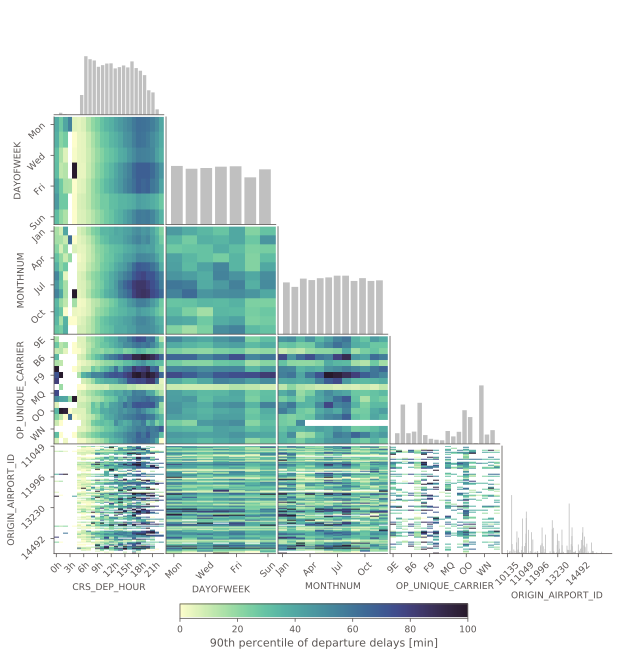

In [30]:
# colors show the 90th percentile of delay times
feature_grid_triangle(df, ['CRS_DEP_HOUR', 'DAYOFWEEK', 'MONTHNUM', 
                          'OP_UNIQUE_CARRIER', 'ORIGIN_AIRPORT_ID'], 
                      z='DEP_DELAY', quant=0.9, vmin=0, vmax=100);

There's a lot of structure in there! For instance, we can see a horizontal gradient in each row of the `CRS_DEP_HOUR` column, corresponding to our previous observation that later flights have longer delays. We also see an increase around the summer months, and so on.

---

For our next and final feature grid, we'll define a new variable, `IS_LATE`, which is True if a flight is delayed by more than 30 minutes and False otherwise:

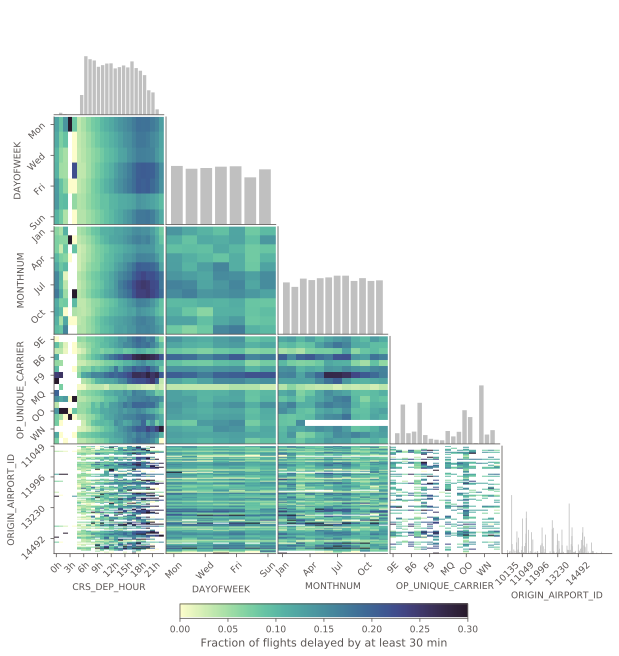

In [31]:
def flag_me(x):
    if x >= 30:
        return 1
    return 0

df['IS_LATE'] = df['DEP_DELAY'].apply(lambda x: flag_me(x))

# colors show the fraction of flights that are at least 30 min late
feature_grid_triangle(df, ['CRS_DEP_HOUR', 'DAYOFWEEK', 'MONTHNUM', 
                          'OP_UNIQUE_CARRIER', 'ORIGIN_AIRPORT_ID'], 
                      z='IS_LATE', vmin=0, vmax=0.3);

Once again, lots of structure! This looks very similar to the previous plot, which makes sense because we chose a delay threshold far from the median (or even mean) value. In other words, if a combination of features corresponds to a higher $90^{\rm th}$ percentile delay, then it should also have a higher fraction of delayed flights generally.

---

So far, looking promising for some modeling..!


---
**<center><font size="4">More coming soon! :)</font></center>**